In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import os
from glob import glob
from tqdm import tqdm
from random import randint
from IPython.display import clear_output
import ast

In [2]:
train_anns = dict()
train_anns['images'] = []
train_anns['annotations'] = []
train_anns['categories'] = [{'id': 0, 'name': 'wheat'}]
iid = 0
im2id = {}
aid = 0


In [3]:
## Init constant
DATA_DIR = './data/Wheatdetection'
IMG_DIR = f"{DATA_DIR}/train"
TARGETS = ['arvalis_1', 'arvalis_2', 'arvalis_3', 'inrae_1', 'usask_1', 'rres_1', 'ethz_1']
N_PATCH = [(2, 3), (2, 2), (2, 2), (2, 2), (1, 2), (2, 3), (1, 2)]
BOX_COLOR = [0,0,255]

### Image utils function

In [4]:
def plot_img(img, size=(7,7), is_rgb=False, title=""):
    if isinstance(img, str):
        img = load_img(img)
    plt.figure(figsize=size)
    if is_rgb:
        plt.imshow(img)
    else:
        plt.imshow(img[:,:,::-1])
    plt.suptitle(title)
    plt.show()
    
def plot_imgs(imgs, cols=5, size=7, is_rgb=False, title=""):
    rows = len(imgs)//cols + 1
    fig = plt.figure(figsize=(cols*size, rows*size))
    for i, img in enumerate(imgs):
        if isinstance(img, str):
            img = load_img(img, size=300)
        fig.add_subplot(rows, cols, i+1)
        if is_rgb:
            plt.imshow(img)
        else:
            plt.imshow(img[:,:,::-1])
    plt.suptitle(title)
    plt.show()
    
def visualize_bbox(img, boxes, thickness=3, color=BOX_COLOR):
    img_copy = img.copy()
    for box in boxes:
        #if(box[0] > 900 or box[1] > 900 or box[2] > 900 or box[3] > 900):
        if(box[0]%1024==0 or box[1]%1024==0 or box[2]%1024==0 or box[3]%1024==0):
          #if(box[0]% 1024 < 50 or box[0]%1024 > 970 or box[2]% 1024 < 50 or box[2]%1024 > 970 or box[1]% 1024 < 50 or box[1]%1024 > 970 or box[3]% 1024 < 50 or box[3]%1024 > 970):
            img_copy = cv2.rectangle(
                img_copy,
                (int(box[0]), int(box[1])),
                (int(box[2]), int(box[3])),
                color, thickness)
    return img_copy

def load_img(img_id):
    cv2.imread(f"{IMG_DIR}/{img_id}.jpg")

In [5]:

df = pd.read_csv(f"{DATA_DIR}/train.csv")
df[['x1', 'y1', 'w', 'h']] = pd.DataFrame(np.stack(df['bbox'].apply(lambda x: ast.literal_eval(x)))).astype(np.float32)
df['x2'] = df['x1'] + df['w']
df['y2'] = df['y1'] + df['h']
df.head()

,image_id,width,height,bbox,source,x1,y1,w,h,x2,y2
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,834.0,222.0,56.0,36.0,890.0,258.0
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,226.0,548.0,130.0,58.0,356.0,606.0
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,377.0,504.0,74.0,160.0,451.0,664.0
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,834.0,95.0,109.0,107.0,943.0,202.0
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,26.0,144.0,124.0,117.0,150.0,261.0


## Get left, right, top, bottom edges each image 

# Note: Run this for each tar_id for several times to generate COCO

In [7]:
marking = pd.read_csv(f"{DATA_DIR}/train.csv")
bboxs = np.stack(marking['bbox'].apply(lambda x: np.fromstring(x[1:-1], sep=',')))
for i, column in enumerate(['x', 'y', 'w', 'h']):
    marking[column] = bboxs[:,i]
marking.drop(columns=['bbox'], inplace=True)

import os
from datetime import datetime
import time
import random
import cv2
import pandas as pd
import numpy as np
import albumentations as A
import matplotlib.pyplot as plt
from albumentations.pytorch.transforms import ToTensorV2
from sklearn.model_selection import StratifiedKFold
from torch.utils.data import Dataset,DataLoader
from torch.utils.data.sampler import SequentialSampler, RandomSampler
from glob import glob

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

df_folds = marking[['image_id']].copy()
df_folds.loc[:, 'bbox_count'] = 1
df_folds = df_folds.groupby('image_id').count()
df_folds.loc[:, 'source'] = marking[['image_id', 'source']].groupby('image_id').min()['source']
df_folds.loc[:, 'stratify_group'] = np.char.add(
    df_folds['source'].values.astype(str),
    df_folds['bbox_count'].apply(lambda x: f'_{x // 15}').values.astype(str)
)
df_folds.loc[:, 'fold'] = 0

print(set(df_folds.source.values))

for fold_number, (train_index, val_index) in enumerate(skf.split(X=df_folds.index, y=df_folds['stratify_group'])):
    df_folds.loc[df_folds.iloc[val_index].index, 'fold'] = fold_number
    
val_id = df_folds[df_folds['fold'] == fold_number].index.values

{'inrae_1', 'rres_1', 'usask_1', 'arvalis_1', 'arvalis_3', 'arvalis_2', 'ethz_1'}


/home/peiyuanl/anaconda3/envs/gnn/lib/python3.7/site-packages/sklearn/model_selection/_split.py:657: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


In [8]:
val_id

array(['00333207f', '02640d9da', '030314634', '03173a1a5', '036cbd683',
       '037024e13', '03a242bd2', '043a957ca', '044097f45', '0478cbc2a',
       '05c6591ee', '060fd0cd8', '06152e5bf', '06812a4fc', '069719eab',
       '07d6634c4', '085d0d511', '08a55ca8a', '0923194d6', '0a4408b37',
       '0adcb2a1a', '0bbb17b82', '0ca410614', '0d08bc31f', '0dbfcf802',
       '0dc2de69d', '0dd534f81', '0e2be222f', '0eab04c31', '0ee812df9',
       '0eed0a689', '0f9100915', '108c78542', '119969932', '125118d1d',
       '12e8267b0', '12ef135a7', '13b0e960a', '13f7f0e24', '147706d0f',
       '14fd84198', '15153bb54', '152800a47', '1577c6651', '15feda382',
       '16501f9a1', '16d26f266', '16d922704', '16daa81b4', '16e075fbb',
       '1772cb764', '18059ff19', '181637e7b', '18e5e064b', '198df0975',
       '199350a76', '19b035d25', '19f4faf0f', '19fd72f8b', '19fdbeb90',
       '1a13195b8', '1adb61e33', '1ae79fd9b', '1b2a30a59', '1b399c9a7',
       '1b43ca0a6', '1b99d2fd6', '1be796d9d', '1bf4fb6e5', '1c01

In [9]:
TAR_ID = 0
img_ids = df[df["source"] == TARGETS[TAR_ID]]["image_id"].unique()
IMG_N = len(img_ids)
print(IMG_N)

l_edges = []
r_edges = []
t_edges = []
b_edges = []

for i, img_id in enumerate(img_ids):
    img = cv2.imread(f"{IMG_DIR}/{img_id}.jpg")
    ## normalize values by dividing max values
    l_edges.append(img[:,:1,:] / img[:,:1,:].max())
    r_edges.append(img[:,-1:,:] / img[:,-1:,:].max())
    t_edges.append(img[:1,:,:] / img[:1,:,:].max())
    b_edges.append(img[-1:,:,:] / img[-1:,:,:].max())
    
l_edges = np.squeeze(np.array(l_edges))
r_edges = np.squeeze(np.array(r_edges))
t_edges = np.squeeze(np.array(t_edges))
b_edges = np.squeeze(np.array(b_edges))

1055


## Compute left-right distance, top-bottom distance matrix

LR_distance[i,j]: distance between I image's left edge and J image's right edge

TB_distance[i,j]: distance between I image's top edge and J image's bottom edge

In [10]:
def distance(edge1, edge2):
    d1 = np.abs(edge1 - edge2).mean()
    d2 = np.abs(edge1[1:,:] - edge2[:-1,:]).mean()
    d3 = np.abs(edge2[1:,:] - edge1[:-1,:]).mean()
    total_distance = d1+d2+d3
    return total_distance


LR_distance = np.zeros((IMG_N, IMG_N)) + 1e3
TB_distance = np.zeros((IMG_N, IMG_N)) + 1e3

for i, left in enumerate(l_edges):
    for j, right in enumerate(r_edges):
        if i == j:
            continue
        LR_distance[i,j] = distance(left, right)
print(LR_distance.shape)


for i, top in enumerate(t_edges):
    for j, bottom in enumerate(b_edges):
        if i == j:
            continue
        TB_distance[i,j] = distance(top, bottom)
print(TB_distance.shape)

(1055, 1055)
(1055, 1055)


# Search best matches 

In [11]:
def get_best_bottom_img(top_id, TB_distance):
    index = np.argmin(TB_distance[:, top_id])
    distance = TB_distance[index, top_id]
    return index, distance

def get_best_right_img(left_id, LR_distance):
    index = np.argmin(LR_distance[:, left_id])
    distance = LR_distance[index, left_id]
    return index, distance

def get_best_right_bottom_img(top_id, left_id, TB_distance, LR_distance):
    index = np.argmin(TB_distance[:, top_id] + LR_distance[:, left_id])
    distance = (TB_distance[index, top_id] + LR_distance[index, left_id])/2
    return index, distance

def index_grid_to_info_grid(patch_grid, img_ids):
    h_grid, w_grid = patch_grid.shape
    PATCH_INFO_GRID = np.zeros(patch_grid.shape).astype(np.object)
    for row in range(h_grid):
        for col in range(w_grid):
            index = patch_grid[row, col]
            PATCH_INFO_GRID[row, col] = {
                "index": index,
                "img_id": img_ids[index]
            }
    return PATCH_INFO_GRID


## Convert index-grid to info-grid
def combine_result(patch_grid, df):
    h, w = patch_grid.shape
    total_img = np.zeros((h*1024, w*1024, 3))
    all_boxes = []
    patch_img_ids = []
    
    for r in range(h):
        for c in range(w):
            img_id = patch_grid[r, c]["img_id"]
            patch_img = cv2.imread(f"{IMG_DIR}/{img_id}.jpg")
            
            xrange = [c*1024, (c+1)*1024]
            yrange = [r*1024, (r+1)*1024]
            total_img[
                yrange[0] : yrange[1],
                xrange[0] : xrange[1], :
            ] = patch_img
            
            boxes = df[df["image_id"] == img_id][["x1", 'y1', 'x2', 'y2']]
            boxes["x1"] += xrange[0]
            boxes["x2"] += xrange[0]
            boxes["y1"] += yrange[0]
            boxes["y2"] += yrange[0]
            all_boxes.append(boxes)
            patch_img_ids.append(img_id)
    all_boxes = pd.concat(all_boxes)
    total_img = total_img.astype(np.uint8)
    return total_img, all_boxes, patch_img_ids

def combine_result_masked(patch_grid, df):
    h, w = patch_grid.shape
    total_img = np.zeros((h*1024, w*1024, 3))
    all_boxes = []
    patch_img_ids = []
    
    for r in range(h):
        for c in range(w):
            img_id = patch_grid[r, c]["img_id"]
            patch_img = cv2.imread(f"{IMG_DIR}/{img_id}.jpg")
            
            xrange = [c*1024, (c+1)*1024]
            yrange = [r*1024, (r+1)*1024]
            
            #print(img_id)
            if img_id not in val_id:
                total_img[
                    yrange[0] : yrange[1],
                    xrange[0] : xrange[1], :
                ] = patch_img
            
            boxes = df[df["image_id"] == img_id][["x1", 'y1', 'x2', 'y2']]
            boxes["x1"] += xrange[0]
            boxes["x2"] += xrange[0]
            boxes["y1"] += yrange[0]
            boxes["y2"] += yrange[0]
            if img_id not in val_id: all_boxes.append(boxes)
            patch_img_ids.append(img_id)
    all_boxes = pd.concat(all_boxes)
    total_img = total_img.astype(np.uint8)
    return total_img, all_boxes, patch_img_ids

## Main stratery

In [12]:
print(TAR_ID)
THRESHOLDS = [0.25, 0.33, 0.25, 0.25, 0.2, 0.1, 0.25]
threshold = THRESHOLDS[TAR_ID]
ALL_PATCH_GRIDS = []

for i, img_id in enumerate(img_ids):
    PATCH_GRID = np.zeros(N_PATCH[TAR_ID]).astype(np.object)
    h_grid, w_grid = PATCH_GRID.shape 
    PATCH_GRID[0,0] = i
    all_distance = []
    
    for row in range(h_grid):
        for col in range(w_grid):
            if col == 0 and row == 0:
                continue
            if col == 0:
                top_id = int(PATCH_GRID[row-1, col])
                PATCH_GRID[row, col], distance = get_best_bottom_img(top_id, TB_distance)
            if row == 0:
                left_id = int(PATCH_GRID[row, col-1])
                PATCH_GRID[row, col], distance = get_best_right_img(left_id, LR_distance)
            if row*col > 0:
                top_id = PATCH_GRID[row-1,col]
                left_id = PATCH_GRID[row, col-1]
                PATCH_GRID[row, col], distance = get_best_right_bottom_img(
                    top_id, left_id,
                    TB_distance, LR_distance
                )
            all_distance.append(distance)

    avg_distance = np.mean(all_distance)
    if avg_distance < threshold:
        ALL_PATCH_GRIDS.append(PATCH_GRID)
        
print(len(ALL_PATCH_GRIDS))

0
106


## Save new data

Remove the comment code if you want to save data

In [1]:
all_new_data = []
source = TARGETS[TAR_ID]
new_img_dir = "origin_img_masked" 
os.makedirs(new_img_dir, exist_ok=True)

for i, patch_grid in enumerate(ALL_PATCH_GRIDS):
    patch_grid = index_grid_to_info_grid(patch_grid, img_ids)
    total_img, boxes, patch_img_ids = combine_result_masked(patch_grid, df)
    bimg = total_img.copy()
    #print(boxes)
    for box in boxes.iterrows():
        box = box[1]
        bimg = cv2.rectangle(bimg,(box.x1, box.y1),(box.x2, box.y2),(102,255,0), 3)
    new_img_ids = source + '_' + "_".join(patch_img_ids)
    boxes["image_id"] = new_img_ids
    all_new_data.append(boxes)
    cv2.imwrite(f"{new_img_dir}/{new_img_ids}.jpg", total_img)
    cv2.imwrite(f"annotated/{new_img_ids}_annotated.jpg", bimg)
    
    if i < 5:
        total_img = visualize_bbox(total_img, boxes.values)
        plot_img(total_img, size=(10,10))
        #print(new_img_ids)

all_new_data = pd.concat(all_new_data)
csv_path = f"origin_{source}.csv"
print(f"SAVE NEW DATA IN: {csv_path}")

all_new_data.to_csv(csv_path)

NameError: name 'TARGETS' is not defined

In [11]:
all_new_data

,x1,y1,x2,y2,image_id
7398,1.0,98.0,158.0,181.0,arvalis_1_4021d47d4_d79169f0e_1b10b9fa1_4e02ed...
7399,96.0,152.0,251.0,274.0,arvalis_1_4021d47d4_d79169f0e_1b10b9fa1_4e02ed...
7400,99.0,195.0,259.0,343.0,arvalis_1_4021d47d4_d79169f0e_1b10b9fa1_4e02ed...
7401,304.0,84.0,395.0,215.0,arvalis_1_4021d47d4_d79169f0e_1b10b9fa1_4e02ed...
7402,435.0,74.0,543.0,201.0,arvalis_1_4021d47d4_d79169f0e_1b10b9fa1_4e02ed...
...,...,...,...,...,...
43205,2595.0,1911.0,2695.0,2000.0,arvalis_1_7c79cea8f_4f9eceb2b_0eab04c31_4ae7a0...
43206,2855.0,1750.0,2918.0,1825.0,arvalis_1_7c79cea8f_4f9eceb2b_0eab04c31_4ae7a0...
43207,2944.0,1789.0,3046.0,1872.0,arvalis_1_7c79cea8f_4f9eceb2b_0eab04c31_4ae7a0...
43208,2892.0,1543.0,2985.0,1644.0,arvalis_1_7c79cea8f_4f9eceb2b_0eab04c31_4ae7a0...


In [12]:
for im in tqdm(list(set(all_new_data.image_id.values))):
    image = cv2.imread(f"{new_img_dir}/{new_img_ids}.jpg")
    height, width, _ = image.shape
    image = {
        'file_name': f"{im}.jpg",
        'height': height,
        'width': width,
        'id': iid
            }
    train_anns['images'].append(image)
    im2id[im] = iid
    iid+=1
    #print(image.shape)
    #break

area = lambda x: (int(x[3])-int(x[1]))*(int(x[2])-int(x[0]))
for _, row in tqdm(all_new_data.iterrows()):
    #print(eval(row.bbox))
    bbox = [row.x1, row.y1, row.x2, row.y2]
    x = bbox
    ann = {
        'segmentation': [[x[0],x[1], #(x1, y1)
                          x[2],x[1], #(x2, y1)
                          x[2],x[3], #(x2, y2)
                          x[0],x[3]]], #(x1, y1)
        'area': area(bbox),
        'iscrowd': 0,
        'image_id': im2id[row.image_id],
        'bbox': bbox,
        'category_id': 0,
        'id': aid
    }
    aid += 1
    train_anns['annotations'].append(ann)
    #break

100%|██████████| 106/106 [00:07<00:00, 13.97it/s]
24360it [00:03, 8061.19it/s]


In [15]:
#train_anns

In [16]:
import json
"""
ANN = '/home/peiyuanl/kaggle/wheat_det/'
# Serializing json  
json_object = json.dumps(train_anns, indent = 4) 

with open(ANN+"full_annotations.json", "w") as outfile: 
    outfile.write(json_object) 
"""

'\nANN = \'/home/peiyuanl/kaggle/wheat_det/\'\n# Serializing json  \njson_object = json.dumps(train_anns, indent = 4) \n\nwith open(ANN+"full_annotations.json", "w") as outfile: \n    outfile.write(json_object) \n'

In [52]:
df = all_new_data

In [53]:
ut = 1
lt = 1023
a = df.loc[df['x1']==1024]
b = df.loc[df['x2']==1024]
#c = df.loc[df['y1']%1024<ut]
#d = df.loc[df['y2']%1024<ut]
#e = df.loc[df['x1']%1024>lt]
#f = df.loc[df['x2']%1024>lt]
#g = df.loc[df['y1']%1024>lt]
#h = df.loc[df['y2']%1024>lt]
#(box[0]%1024==0 or box[1]%1024==0 or box[2]%1024==0 or box[3]%1024==0):

In [54]:
cands = pd.concat([a,b]).drop_duplicates()
rest = df[~df.apply(tuple,1).isin(cands.apply(tuple,1))]

In [55]:
len(set(cands.image_id.values))

106

In [56]:
def overlap(ax1, ax2, bx1, bx2):
    #print(bx1, bx2)
    #print(ax1, ax2, bx1, bx2)
    if (ax1 > bx2) or (bx1 > ax2): return -1
    intersection = bx2 - ax1 if ax2 > bx2 else ax2 - bx1
    union = max(ax2, bx2) - min(ax1, bx1)
    #print(intersection, union)
    return float(intersection)/float(union)

In [57]:
from functools import reduce

csvs = []
for im in list(set(cands.image_id.values)):
    print('===============')
    print(im)
    imdf = (cands.loc[cands['image_id']==im])
    
    mat = imdf[['x1','y1','x2','y2']].values
    
    x1 = imdf[['x1']].values.reshape(-1)
    x2 = imdf[['x2']].values.reshape(-1)
    y1 = imdf[['y1']].values.reshape(-1)
    y2 = imdf[['y2']].values.reshape(-1)

    matched_pairs = []
    matched_boxes = []
    visited = set()
    
    threshold = 200
    matches = np.where(x2==1024)[0]
    
    r_cands = np.where(x1==1024)[0]
    
    print(matches, r_cands)
    
    for idx in r_cands:
        if idx in visited: continue
        if x1[idx] != 1024: continue
        
        #print(matches)
        if (len(matches) > 0):
            ay1 = y1[idx]
            ay2 = y2[idx]
            
            max_id = -1
            max_cov = -1
            for ma in matches:
                if ma in visited: continue
                cov = overlap(ay1,ay2,y1[ma],y2[ma]) 
                print(ay1,ay2,y1[ma],y2[ma])
                print("[idx {}, idx2 {}]: {}".format(idx, ma, cov))
                if cov == -1: continue
                if cov > max_cov:
                    max_id = ma
                    max_cov = cov
                    
            if (max_cov > 0.4):
                matched_pairs.append((idx,max_id))
                assert idx not in visited
                assert max_id not in visited
                visited.add(idx)
                visited.add(max_id)
                dx1 = min(x1[idx],x1[max_id])
                dy1 = min(y1[idx],y1[max_id])
                dx2 = max(x2[idx],x2[max_id])
                dy2 = max(y2[idx],y2[max_id])
                data = {
                    'image_id':im,
                    'x1': dx1,
                    'y1': dy1,
                    'x2': dx2,
                    'y2': dy2,
                }
                matched_boxes.append(pd.DataFrame(columns=['x1','y1','x2','y2','image_id'],data=data,index=[0]))
                
    print(matched_pairs) 
    #matched_indices = list(reduce(lambda x,y: x+y, matched_pairs)) if len(matched_pairs) > 0 else []
    #print(matched_indices)
    unmatched_indices = [i for i in range(len(x1)) if i not in visited]
    unmatched_boxes = imdf.iloc[unmatched_indices]
    
    matched_boxes = pd.concat(matched_boxes) if len(matched_boxes) > 0 else None
    csv=pd.concat([matched_boxes, unmatched_boxes]) if matched_boxes is not None else unmatched_boxes
    #print(csv)
    csvs.append(csv)
    #break

arvalis_1_f931c0224_5f3d068f1_8fee7acd5_2c3d40735_1dbc99ed8_8ebda8cba
[6 7 8] [0 1 2 3 4 5]
844.0 912.0 474.0 555.0
[idx 0, idx2 6]: -1
844.0 912.0 532.0 663.0
[idx 0, idx2 7]: -1
844.0 912.0 1024.0 1043.0
[idx 0, idx2 8]: -1
970.0 1024.0 474.0 555.0
[idx 1, idx2 6]: -1
970.0 1024.0 532.0 663.0
[idx 1, idx2 7]: -1
970.0 1024.0 1024.0 1043.0
[idx 1, idx2 8]: 0.0
221.0 293.0 474.0 555.0
[idx 2, idx2 6]: -1
221.0 293.0 532.0 663.0
[idx 2, idx2 7]: -1
221.0 293.0 1024.0 1043.0
[idx 2, idx2 8]: -1
150.0 200.0 474.0 555.0
[idx 3, idx2 6]: -1
150.0 200.0 532.0 663.0
[idx 3, idx2 7]: -1
150.0 200.0 1024.0 1043.0
[idx 3, idx2 8]: -1
532.0 663.0 474.0 555.0
[idx 4, idx2 6]: 0.12169312169312169
532.0 663.0 532.0 663.0
[idx 4, idx2 7]: 1.0
532.0 663.0 1024.0 1043.0
[idx 4, idx2 8]: -1
1024.0 1043.0 474.0 555.0
[idx 5, idx2 6]: -1
1024.0 1043.0 1024.0 1043.0
[idx 5, idx2 8]: 1.0
[(4, 7), (5, 8)]
arvalis_1_0bb98c55d_da0c40152_4c55b9a80_966c3ebc6_5b3ca5452_d89f4ea06
[4 5 6] [0 1 2 3]
423.0 529.0 96.0

1984.0 2048.0 1984.0 2048.0
[idx 4, idx2 9]: 1.0
[(2, 5), (3, 7), (4, 9)]
arvalis_1_133f92be6_d50c71d8c_400553ddc_a0ae5ad8e_63c658201_e3732d7b7
[ 6  7  8  9 10] [0 1 2 3 4 5]
245.0 325.0 245.0 325.0
[idx 0, idx2 6]: 1.0
245.0 325.0 100.0 168.0
[idx 0, idx2 7]: -1
245.0 325.0 478.0 545.0
[idx 0, idx2 8]: -1
245.0 325.0 1570.0 1677.0
[idx 0, idx2 9]: -1
245.0 325.0 1782.0 1853.0
[idx 0, idx2 10]: -1
100.0 168.0 100.0 168.0
[idx 1, idx2 7]: 1.0
100.0 168.0 478.0 545.0
[idx 1, idx2 8]: -1
100.0 168.0 1570.0 1677.0
[idx 1, idx2 9]: -1
100.0 168.0 1782.0 1853.0
[idx 1, idx2 10]: -1
609.0 811.0 478.0 545.0
[idx 2, idx2 8]: -1
609.0 811.0 1570.0 1677.0
[idx 2, idx2 9]: -1
609.0 811.0 1782.0 1853.0
[idx 2, idx2 10]: -1
1110.0 1185.0 478.0 545.0
[idx 3, idx2 8]: -1
1110.0 1185.0 1570.0 1677.0
[idx 3, idx2 9]: -1
1110.0 1185.0 1782.0 1853.0
[idx 3, idx2 10]: -1
1570.0 1677.0 478.0 545.0
[idx 4, idx2 8]: -1
1570.0 1677.0 1570.0 1677.0
[idx 4, idx2 9]: 1.0
1570.0 1677.0 1782.0 1853.0
[idx 4, idx2 1

arvalis_1_3dc3a72f9_df53b43f1_7b7a3b322_6a9534cf5_e2e13ad15_a1da0dfe1
[2 3] [0 1]
563.0 659.0 563.0 659.0
[idx 0, idx2 2]: 1.0
563.0 659.0 1103.0 1204.0
[idx 0, idx2 3]: -1
1103.0 1204.0 1103.0 1204.0
[idx 1, idx2 3]: 1.0
[(0, 2), (1, 3)]
arvalis_1_12e8267b0_fbecfeba8_c328e6c68_f7b557230_da389bd36_c9d1bc268
[7 8 9] [0 1 2 3 4 5 6]
267.0 349.0 1034.0 1216.0
[idx 0, idx2 7]: -1
267.0 349.0 1786.0 2017.0
[idx 0, idx2 8]: -1
267.0 349.0 1899.0 1959.0
[idx 0, idx2 9]: -1
401.0 482.0 1034.0 1216.0
[idx 1, idx2 7]: -1
401.0 482.0 1786.0 2017.0
[idx 1, idx2 8]: -1
401.0 482.0 1899.0 1959.0
[idx 1, idx2 9]: -1
909.0 972.0 1034.0 1216.0
[idx 2, idx2 7]: -1
909.0 972.0 1786.0 2017.0
[idx 2, idx2 8]: -1
909.0 972.0 1899.0 1959.0
[idx 2, idx2 9]: -1
1034.0 1216.0 1034.0 1216.0
[idx 3, idx2 7]: 1.0
1034.0 1216.0 1786.0 2017.0
[idx 3, idx2 8]: -1
1034.0 1216.0 1899.0 1959.0
[idx 3, idx2 9]: -1
1238.0 1402.0 1786.0 2017.0
[idx 4, idx2 8]: -1
1238.0 1402.0 1899.0 1959.0
[idx 4, idx2 9]: -1
1455.0 1569.

arvalis_1_c4b7bc850_a134e203f_e6b5f3375_42b47b7e1_6db264b94_4285f0271
[4 5 6 7] [0 1 2 3]
0.0 74.0 0.0 74.0
[idx 0, idx2 4]: 1.0
0.0 74.0 1024.0 1110.0
[idx 0, idx2 5]: -1
0.0 74.0 1257.0 1387.0
[idx 0, idx2 6]: -1
0.0 74.0 1527.0 1620.0
[idx 0, idx2 7]: -1
559.0 634.0 1024.0 1110.0
[idx 1, idx2 5]: -1
559.0 634.0 1257.0 1387.0
[idx 1, idx2 6]: -1
559.0 634.0 1527.0 1620.0
[idx 1, idx2 7]: -1
1257.0 1387.0 1024.0 1110.0
[idx 2, idx2 5]: -1
1257.0 1387.0 1257.0 1387.0
[idx 2, idx2 6]: 1.0
1257.0 1387.0 1527.0 1620.0
[idx 2, idx2 7]: -1
1527.0 1620.0 1024.0 1110.0
[idx 3, idx2 5]: -1
1527.0 1620.0 1527.0 1620.0
[idx 3, idx2 7]: 1.0
[(0, 4), (2, 6), (3, 7)]
arvalis_1_91c9c8b5e_6df511e97_1708360c3_d6d425855_aa19d5412_4ecd10d42
[5 6 7 8] [0 1 2 3 4]
305.0 392.0 305.0 392.0
[idx 0, idx2 5]: 1.0
305.0 392.0 688.0 795.0
[idx 0, idx2 6]: -1
305.0 392.0 1201.0 1312.0
[idx 0, idx2 7]: -1
305.0 392.0 1709.0 1756.0
[idx 0, idx2 8]: -1
688.0 795.0 688.0 795.0
[idx 1, idx2 6]: 1.0
688.0 795.0 1201.0 

472.0 544.0 403.0 469.0
[idx 4, idx2 11]: -1
472.0 544.0 865.0 937.0
[idx 4, idx2 12]: -1
472.0 544.0 1189.0 1251.0
[idx 4, idx2 13]: -1
472.0 544.0 1158.0 1244.0
[idx 4, idx2 14]: -1
472.0 544.0 1338.0 1410.0
[idx 4, idx2 15]: -1
403.0 458.0 403.0 469.0
[idx 5, idx2 11]: 0.8333333333333334
403.0 458.0 865.0 937.0
[idx 5, idx2 12]: -1
403.0 458.0 1189.0 1251.0
[idx 5, idx2 13]: -1
403.0 458.0 1158.0 1244.0
[idx 5, idx2 14]: -1
403.0 458.0 1338.0 1410.0
[idx 5, idx2 15]: -1
1158.0 1244.0 865.0 937.0
[idx 6, idx2 12]: -1
1158.0 1244.0 1189.0 1251.0
[idx 6, idx2 13]: 0.5913978494623656
1158.0 1244.0 1158.0 1244.0
[idx 6, idx2 14]: 1.0
1158.0 1244.0 1338.0 1410.0
[idx 6, idx2 15]: -1
1338.0 1410.0 865.0 937.0
[idx 7, idx2 12]: -1
1338.0 1410.0 1189.0 1251.0
[idx 7, idx2 13]: -1
1338.0 1410.0 1338.0 1410.0
[idx 7, idx2 15]: 1.0
1499.0 1590.0 865.0 937.0
[idx 8, idx2 12]: -1
1499.0 1590.0 1189.0 1251.0
[idx 8, idx2 13]: -1
[(0, 9), (3, 10), (5, 11), (6, 14), (7, 15)]
arvalis_1_147830115_f72c

arvalis_1_dc6ca8430_76e56c0b1_9c29fd766_4b83b6541_a886d1e61_a3ec4d1d3
[ 8  9 10 11 12 13 14] [0 1 2 3 4 5 6 7]
54.0 146.0 54.0 146.0
[idx 0, idx2 8]: 1.0
54.0 146.0 122.0 274.0
[idx 0, idx2 9]: 0.10909090909090909
54.0 146.0 735.0 809.0
[idx 0, idx2 10]: -1
54.0 146.0 819.0 900.0
[idx 0, idx2 11]: -1
54.0 146.0 1024.0 1053.0
[idx 0, idx2 12]: -1
54.0 146.0 1171.0 1302.0
[idx 0, idx2 13]: -1
54.0 146.0 1490.0 1563.0
[idx 0, idx2 14]: -1
122.0 274.0 122.0 274.0
[idx 1, idx2 9]: 1.0
122.0 274.0 735.0 809.0
[idx 1, idx2 10]: -1
122.0 274.0 819.0 900.0
[idx 1, idx2 11]: -1
122.0 274.0 1024.0 1053.0
[idx 1, idx2 12]: -1
122.0 274.0 1171.0 1302.0
[idx 1, idx2 13]: -1
122.0 274.0 1490.0 1563.0
[idx 1, idx2 14]: -1
735.0 809.0 735.0 809.0
[idx 2, idx2 10]: 1.0
735.0 809.0 819.0 900.0
[idx 2, idx2 11]: -1
735.0 809.0 1024.0 1053.0
[idx 2, idx2 12]: -1
735.0 809.0 1171.0 1302.0
[idx 2, idx2 13]: -1
735.0 809.0 1490.0 1563.0
[idx 2, idx2 14]: -1
819.0 900.0 819.0 900.0
[idx 3, idx2 11]: 1.0
819.0 

1468.0 1564.0 600.0 704.0
[idx 5, idx2 6]: -1
1468.0 1564.0 756.0 830.0
[idx 5, idx2 7]: -1
1468.0 1564.0 1035.0 1227.0
[idx 5, idx2 11]: -1
1468.0 1564.0 1468.0 1564.0
[idx 5, idx2 14]: 1.0
[(0, 8), (1, 9), (2, 10), (3, 12), (4, 13), (5, 14)]
arvalis_1_14e9933bb_77683d1a4_c6454073b_8f54c057d_1ff3f11c4_25b347123
[ 6  7  8  9 10] [0 1 2 3 4 5]
707.0 848.0 707.0 848.0
[idx 0, idx2 6]: 1.0
707.0 848.0 587.0 733.0
[idx 0, idx2 7]: 0.09961685823754789
707.0 848.0 55.0 185.0
[idx 0, idx2 8]: -1
707.0 848.0 1240.0 1348.0
[idx 0, idx2 9]: -1
707.0 848.0 1959.0 2048.0
[idx 0, idx2 10]: -1
587.0 733.0 587.0 733.0
[idx 1, idx2 7]: 1.0
587.0 733.0 55.0 185.0
[idx 1, idx2 8]: -1
587.0 733.0 1240.0 1348.0
[idx 1, idx2 9]: -1
587.0 733.0 1959.0 2048.0
[idx 1, idx2 10]: -1
1007.0 1024.0 55.0 185.0
[idx 2, idx2 8]: -1
1007.0 1024.0 1240.0 1348.0
[idx 2, idx2 9]: -1
1007.0 1024.0 1959.0 2048.0
[idx 2, idx2 10]: -1
1024.0 1116.0 55.0 185.0
[idx 3, idx2 8]: -1
1024.0 1116.0 1240.0 1348.0
[idx 3, idx2 9]: 

510.0 598.0 510.0 598.0
[idx 3, idx2 8]: 1.0
510.0 598.0 1153.0 1292.0
[idx 3, idx2 9]: -1
1153.0 1292.0 1153.0 1292.0
[idx 4, idx2 9]: 1.0
[(1, 6), (2, 7), (3, 8), (4, 9)]


In [58]:
corrected_1 = pd.concat(csvs)
corrected_1 = pd.concat([rest,corrected_1])

In [59]:
a = corrected_1.loc[corrected_1['x1']==2048]
b = corrected_1.loc[corrected_1['x2']==2048]
cands = pd.concat([a,b]).drop_duplicates()
rest = corrected_1[~corrected_1.apply(tuple,1).isin(cands.apply(tuple,1))]

In [62]:
cands

,x1,y1,x2,y2,image_id
13277,2048.0,1245.0,2109.0,1321.0,arvalis_1_4021d47d4_d79169f0e_1b10b9fa1_4e02ed...
13278,2048.0,1320.0,2117.0,1384.0,arvalis_1_4021d47d4_d79169f0e_1b10b9fa1_4e02ed...
13296,2048.0,1890.0,2146.0,1993.0,arvalis_1_4021d47d4_d79169f0e_1b10b9fa1_4e02ed...
9892,2048.0,239.0,2060.0,291.0,arvalis_1_8083f65f2_fe14db6a5_2041a2d49_4a609f...
9934,2048.0,910.0,2102.0,1006.0,arvalis_1_8083f65f2_fe14db6a5_2041a2d49_4a609f...
...,...,...,...,...,...
42376,1985.0,206.0,2048.0,333.0,arvalis_1_7c79cea8f_4f9eceb2b_0eab04c31_4ae7a0...
40329,1982.0,1024.0,2048.0,1073.0,arvalis_1_7c79cea8f_4f9eceb2b_0eab04c31_4ae7a0...
40330,1951.0,1378.0,2048.0,1473.0,arvalis_1_7c79cea8f_4f9eceb2b_0eab04c31_4ae7a0...
40332,2028.0,1475.0,2048.0,1579.0,arvalis_1_7c79cea8f_4f9eceb2b_0eab04c31_4ae7a0...


In [63]:
from functools import reduce

csvs = []
for im in list(set(cands.image_id.values)):
    print('===============')
    print(im)
    imdf = (cands.loc[cands['image_id']==im])
    
    mat = imdf[['x1','y1','x2','y2']].values
    
    x1 = imdf[['x1']].values.reshape(-1)
    x2 = imdf[['x2']].values.reshape(-1)
    y1 = imdf[['y1']].values.reshape(-1)
    y2 = imdf[['y2']].values.reshape(-1)

    matched_pairs = []
    matched_boxes = []
    visited = set()
    
    threshold = 200
    matches = np.where(x2==2048)[0]
    
    r_cands = np.where(x1==2048)[0]
    
    print(matches, r_cands)
    
    for idx in r_cands:
        if idx in visited: continue
        if x1[idx] != 2048: continue
        
        #print(matches)
        if (len(matches) > 0):
            ay1 = y1[idx]
            ay2 = y2[idx]
            
            max_id = -1
            max_cov = -1
            for ma in matches:
                if ma in visited: continue
                cov = overlap(ay1,ay2,y1[ma],y2[ma]) 
                print(ay1,ay2,y1[ma],y2[ma])
                print("[idx {}, idx2 {}]: {}".format(idx, ma, cov))
                if cov == -1: continue
                if cov > max_cov:
                    max_id = ma
                    max_cov = cov
                    
            if (max_cov > 0.4):
                matched_pairs.append((idx,max_id))
                assert idx not in visited
                assert max_id not in visited
                visited.add(idx)
                visited.add(max_id)
                dx1 = min(x1[idx],x1[max_id])
                dy1 = min(y1[idx],y1[max_id])
                dx2 = max(x2[idx],x2[max_id])
                dy2 = max(y2[idx],y2[max_id])
                data = {
                    'image_id':im,
                    'x1': dx1,
                    'y1': dy1,
                    'x2': dx2,
                    'y2': dy2,
                }
                matched_boxes.append(pd.DataFrame(columns=['x1','y1','x2','y2','image_id'],data=data,index=[0]))
                
    print(matched_pairs) 
    #matched_indices = list(reduce(lambda x,y: x+y, matched_pairs)) if len(matched_pairs) > 0 else []
    #print(matched_indices)
    unmatched_indices = [i for i in range(len(x1)) if i not in visited]
    unmatched_boxes = imdf.iloc[unmatched_indices]
    
    matched_boxes = pd.concat(matched_boxes) if len(matched_boxes) > 0 else None
    csv=pd.concat([matched_boxes, unmatched_boxes]) if matched_boxes is not None else unmatched_boxes
    #print(csv)
    csvs.append(csv)
    #break

arvalis_1_f931c0224_5f3d068f1_8fee7acd5_2c3d40735_1dbc99ed8_8ebda8cba
[ 7  8  9 10 11 12 13 14] [0 1 2 3 4 5 6]
849.0 926.0 849.0 926.0
[idx 0, idx2 7]: 1.0
849.0 926.0 662.0 729.0
[idx 0, idx2 8]: -1
849.0 926.0 290.0 417.0
[idx 0, idx2 9]: -1
849.0 926.0 192.0 294.0
[idx 0, idx2 10]: -1
849.0 926.0 392.0 495.0
[idx 0, idx2 11]: -1
849.0 926.0 1730.0 1857.0
[idx 0, idx2 12]: -1
849.0 926.0 1298.0 1374.0
[idx 0, idx2 13]: -1
849.0 926.0 1204.0 1270.0
[idx 0, idx2 14]: -1
662.0 729.0 662.0 729.0
[idx 1, idx2 8]: 1.0
662.0 729.0 290.0 417.0
[idx 1, idx2 9]: -1
662.0 729.0 192.0 294.0
[idx 1, idx2 10]: -1
662.0 729.0 392.0 495.0
[idx 1, idx2 11]: -1
662.0 729.0 1730.0 1857.0
[idx 1, idx2 12]: -1
662.0 729.0 1298.0 1374.0
[idx 1, idx2 13]: -1
662.0 729.0 1204.0 1270.0
[idx 1, idx2 14]: -1
192.0 294.0 290.0 417.0
[idx 2, idx2 9]: 0.017777777777777778
192.0 294.0 192.0 294.0
[idx 2, idx2 10]: 1.0
192.0 294.0 392.0 495.0
[idx 2, idx2 11]: -1
192.0 294.0 1730.0 1857.0
[idx 2, idx2 12]: -1
192.

425.0 610.0 856.0 934.0
[idx 0, idx2 9]: -1
425.0 610.0 367.0 422.0
[idx 0, idx2 10]: -1
425.0 610.0 1093.0 1189.0
[idx 0, idx2 11]: -1
425.0 610.0 1510.0 1641.0
[idx 0, idx2 12]: -1
425.0 610.0 1377.0 1490.0
[idx 0, idx2 13]: -1
425.0 610.0 1252.0 1349.0
[idx 0, idx2 14]: -1
758.0 837.0 758.0 837.0
[idx 1, idx2 8]: 1.0
758.0 837.0 856.0 934.0
[idx 1, idx2 9]: -1
758.0 837.0 367.0 422.0
[idx 1, idx2 10]: -1
758.0 837.0 1093.0 1189.0
[idx 1, idx2 11]: -1
758.0 837.0 1510.0 1641.0
[idx 1, idx2 12]: -1
758.0 837.0 1377.0 1490.0
[idx 1, idx2 13]: -1
758.0 837.0 1252.0 1349.0
[idx 1, idx2 14]: -1
856.0 934.0 856.0 934.0
[idx 2, idx2 9]: 1.0
856.0 934.0 367.0 422.0
[idx 2, idx2 10]: -1
856.0 934.0 1093.0 1189.0
[idx 2, idx2 11]: -1
856.0 934.0 1510.0 1641.0
[idx 2, idx2 12]: -1
856.0 934.0 1377.0 1490.0
[idx 2, idx2 13]: -1
856.0 934.0 1252.0 1349.0
[idx 2, idx2 14]: -1
1206.0 1339.0 367.0 422.0
[idx 3, idx2 10]: -1
1206.0 1339.0 1093.0 1189.0
[idx 3, idx2 11]: -1
1206.0 1339.0 1510.0 1641.0

1104.0 1174.0 1167.0 1237.0
[idx 4, idx2 13]: 0.05263157894736842
1104.0 1174.0 1319.0 1415.0
[idx 4, idx2 14]: -1
1167.0 1237.0 1167.0 1237.0
[idx 5, idx2 13]: 1.0
1167.0 1237.0 1319.0 1415.0
[idx 5, idx2 14]: -1
1244.0 1328.0 1319.0 1415.0
[idx 6, idx2 14]: 0.05263157894736842
1319.0 1415.0 1319.0 1415.0
[idx 7, idx2 14]: 1.0
[(0, 8), (1, 9), (2, 10), (3, 11), (4, 12), (5, 13), (7, 14)]
arvalis_1_61ff5cdc2_c7d3b408d_489706bb1_f1b3454ff_078d5b8b9_68fa4a555
[ 5  6  7  8  9 10] [0 1 2 3 4]
687.0 765.0 1012.0 1024.0
[idx 0, idx2 5]: -1
687.0 765.0 687.0 765.0
[idx 0, idx2 6]: 1.0
687.0 765.0 240.0 321.0
[idx 0, idx2 7]: -1
687.0 765.0 1024.0 1117.0
[idx 0, idx2 8]: -1
687.0 765.0 1192.0 1295.0
[idx 0, idx2 9]: -1
687.0 765.0 1850.0 1925.0
[idx 0, idx2 10]: -1
1390.0 1485.0 1012.0 1024.0
[idx 1, idx2 5]: -1
1390.0 1485.0 240.0 321.0
[idx 1, idx2 7]: -1
1390.0 1485.0 1024.0 1117.0
[idx 1, idx2 8]: -1
1390.0 1485.0 1192.0 1295.0
[idx 1, idx2 9]: -1
1390.0 1485.0 1850.0 1925.0
[idx 1, idx2 1

[2] [0 1]
137.0 206.0 1207.0 1284.0
[idx 0, idx2 2]: -1
1024.0 1063.0 1207.0 1284.0
[idx 1, idx2 2]: -1
[]
arvalis_1_f3ed7c4ee_a13c89a7f_4a66347dc_347ecba39_6d34eb3b2_58cef5c6c
[ 8  9 10 11 12 13 14 15] [0 1 2 3 4 5 6 7]
951.0 1024.0 951.0 1024.0
[idx 0, idx2 8]: 1.0
951.0 1024.0 816.0 937.0
[idx 0, idx2 9]: -1
951.0 1024.0 104.0 216.0
[idx 0, idx2 10]: -1
951.0 1024.0 1957.0 2043.0
[idx 0, idx2 11]: -1
951.0 1024.0 1410.0 1470.0
[idx 0, idx2 12]: -1
951.0 1024.0 1269.0 1335.0
[idx 0, idx2 13]: -1
951.0 1024.0 1112.0 1189.0
[idx 0, idx2 14]: -1
951.0 1024.0 1024.0 1047.0
[idx 0, idx2 15]: 0.0
266.0 478.0 816.0 937.0
[idx 1, idx2 9]: -1
266.0 478.0 104.0 216.0
[idx 1, idx2 10]: -1
266.0 478.0 1957.0 2043.0
[idx 1, idx2 11]: -1
266.0 478.0 1410.0 1470.0
[idx 1, idx2 12]: -1
266.0 478.0 1269.0 1335.0
[idx 1, idx2 13]: -1
266.0 478.0 1112.0 1189.0
[idx 1, idx2 14]: -1
266.0 478.0 1024.0 1047.0
[idx 1, idx2 15]: -1
816.0 937.0 816.0 937.0
[idx 2, idx2 9]: 1.0
816.0 937.0 104.0 216.0
[idx 2,

208.0 288.0 208.0 288.0
[idx 3, idx2 9]: 1.0
208.0 288.0 1421.0 1492.0
[idx 3, idx2 10]: -1
208.0 288.0 1558.0 1628.0
[idx 3, idx2 11]: -1
1421.0 1492.0 1421.0 1492.0
[idx 4, idx2 10]: 1.0
1421.0 1492.0 1558.0 1628.0
[idx 4, idx2 11]: -1
1558.0 1628.0 1558.0 1628.0
[idx 5, idx2 11]: 1.0
[(0, 6), (1, 7), (2, 8), (3, 9), (4, 10), (5, 11)]
arvalis_1_f7d780303_42d5e8791_c4dc3c575_eff99d6e2_f5837f263_d4652c53b
[ 8  9 10 11 12 13 14 15] [0 1 2 3 4 5 6 7]
45.0 140.0 45.0 140.0
[idx 0, idx2 8]: 1.0
45.0 140.0 350.0 433.0
[idx 0, idx2 9]: -1
45.0 140.0 825.0 889.0
[idx 0, idx2 10]: -1
45.0 140.0 908.0 1024.0
[idx 0, idx2 11]: -1
45.0 140.0 668.0 745.0
[idx 0, idx2 12]: -1
45.0 140.0 558.0 636.0
[idx 0, idx2 13]: -1
45.0 140.0 1024.0 1037.0
[idx 0, idx2 14]: -1
45.0 140.0 1037.0 1120.0
[idx 0, idx2 15]: -1
204.0 280.0 350.0 433.0
[idx 1, idx2 9]: -1
204.0 280.0 825.0 889.0
[idx 1, idx2 10]: -1
204.0 280.0 908.0 1024.0
[idx 1, idx2 11]: -1
204.0 280.0 668.0 745.0
[idx 1, idx2 12]: -1
204.0 280.0 

[(2, 7)]
arvalis_1_3aea733b5_5530bd2c3_c4f586e0e_65f5afe35_9043b1fcf_ef156f858
[4 5 6 7] [0 1 2 3]
647.0 736.0 647.0 736.0
[idx 0, idx2 4]: 1.0
647.0 736.0 278.0 391.0
[idx 0, idx2 5]: -1
647.0 736.0 105.0 214.0
[idx 0, idx2 6]: -1
647.0 736.0 1358.0 1471.0
[idx 0, idx2 7]: -1
278.0 391.0 278.0 391.0
[idx 1, idx2 5]: 1.0
278.0 391.0 105.0 214.0
[idx 1, idx2 6]: -1
278.0 391.0 1358.0 1471.0
[idx 1, idx2 7]: -1
105.0 214.0 105.0 214.0
[idx 2, idx2 6]: 1.0
105.0 214.0 1358.0 1471.0
[idx 2, idx2 7]: -1
1358.0 1471.0 1358.0 1471.0
[idx 3, idx2 7]: 1.0
[(0, 4), (1, 5), (2, 6), (3, 7)]
arvalis_1_ba290b964_ff1716939_27e98fa26_044097f45_25c62465e_df0be3f16
[3 4 5] [0 1 2]
633.0 785.0 633.0 785.0
[idx 0, idx2 3]: 1.0
633.0 785.0 348.0 456.0
[idx 0, idx2 4]: -1
633.0 785.0 1183.0 1329.0
[idx 0, idx2 5]: -1
348.0 456.0 348.0 456.0
[idx 1, idx2 4]: 1.0
348.0 456.0 1183.0 1329.0
[idx 1, idx2 5]: -1
1183.0 1329.0 1183.0 1329.0
[idx 2, idx2 5]: 1.0
[(0, 3), (1, 4), (2, 5)]
arvalis_1_f65604566_116a6fce

[idx 1, idx2 4]: -1
[(0, 2), (1, 3)]
arvalis_1_6f10a6f8f_fb2b30bc9_458b7beb9_40191f5cd_0fcdc222b_ebcdcc024
[ 7  8  9 10 11 12 13] [0 1 2 3 4 5 6]
53.0 147.0 53.0 147.0
[idx 0, idx2 7]: 1.0
53.0 147.0 561.0 672.0
[idx 0, idx2 8]: -1
53.0 147.0 671.0 758.0
[idx 0, idx2 9]: -1
53.0 147.0 1577.0 1697.0
[idx 0, idx2 10]: -1
53.0 147.0 1791.0 1930.0
[idx 0, idx2 11]: -1
53.0 147.0 1938.0 2048.0
[idx 0, idx2 12]: -1
53.0 147.0 1217.0 1274.0
[idx 0, idx2 13]: -1
561.0 672.0 561.0 672.0
[idx 1, idx2 8]: 1.0
561.0 672.0 671.0 758.0
[idx 1, idx2 9]: 0.005076142131979695
561.0 672.0 1577.0 1697.0
[idx 1, idx2 10]: -1
561.0 672.0 1791.0 1930.0
[idx 1, idx2 11]: -1
561.0 672.0 1938.0 2048.0
[idx 1, idx2 12]: -1
561.0 672.0 1217.0 1274.0
[idx 1, idx2 13]: -1
671.0 758.0 671.0 758.0
[idx 2, idx2 9]: 1.0
671.0 758.0 1577.0 1697.0
[idx 2, idx2 10]: -1
671.0 758.0 1791.0 1930.0
[idx 2, idx2 11]: -1
671.0 758.0 1938.0 2048.0
[idx 2, idx2 12]: -1
671.0 758.0 1217.0 1274.0
[idx 2, idx2 13]: -1
151.0 215.0 1

1743.0 1845.0 756.0 909.0
[idx 4, idx2 10]: -1
1743.0 1845.0 1743.0 1845.0
[idx 4, idx2 14]: 1.0
1743.0 1845.0 1153.0 1253.0
[idx 4, idx2 15]: -1
1743.0 1845.0 1097.0 1163.0
[idx 4, idx2 16]: -1
1153.0 1253.0 756.0 909.0
[idx 5, idx2 10]: -1
1153.0 1253.0 1153.0 1253.0
[idx 5, idx2 15]: 1.0
1153.0 1253.0 1097.0 1163.0
[idx 5, idx2 16]: 0.0641025641025641
1097.0 1163.0 756.0 909.0
[idx 6, idx2 10]: -1
1097.0 1163.0 1097.0 1163.0
[idx 6, idx2 16]: 1.0
1522.0 1574.0 756.0 909.0
[idx 7, idx2 10]: -1
1532.0 1719.0 756.0 909.0
[idx 8, idx2 10]: -1
[(0, 9), (1, 11), (2, 12), (3, 13), (4, 14), (5, 15), (6, 16)]
arvalis_1_58ce0381b_82890548b_3dd22103f_2d990708e_45402cfbb_3aaa6d134
[4 5 6 7] [0 1 2 3]
529.0 643.0 529.0 643.0
[idx 0, idx2 4]: 1.0
529.0 643.0 416.0 510.0
[idx 0, idx2 5]: -1
529.0 643.0 247.0 396.0
[idx 0, idx2 6]: -1
529.0 643.0 756.0 863.0
[idx 0, idx2 7]: -1
416.0 510.0 416.0 510.0
[idx 1, idx2 5]: 1.0
416.0 510.0 247.0 396.0
[idx 1, idx2 6]: -1
416.0 510.0 756.0 863.0
[idx 1, i

In [64]:
corrected_2 = pd.concat(csvs)
corrected_2 = pd.concat([rest,corrected_2])

In [82]:
a = corrected_2.loc[corrected_2['y1']==1024]
b = corrected_2.loc[corrected_2['y2']==1024]
cands = pd.concat([a,b]).drop_duplicates()
rest = corrected_2[~corrected_2.apply(tuple,1).isin(cands.apply(tuple,1))]

In [83]:
from functools import reduce

csvs = []
for im in list(set(cands.image_id.values)):
    print('===============')
    print(im)
    imdf = (cands.loc[cands['image_id']==im])
    
    mat = imdf[['x1','y1','x2','y2']].values
    
    x1 = imdf[['x1']].values.reshape(-1)
    x2 = imdf[['x2']].values.reshape(-1)
    y1 = imdf[['y1']].values.reshape(-1)
    y2 = imdf[['y2']].values.reshape(-1)

    matched_pairs = []
    matched_boxes = []
    visited = set()
    
    threshold = 200
    matches = np.where(y2==1024)[0]
    
    r_cands = np.where(y1==1024)[0]
    
    print(matches, r_cands)
    
    for idx in r_cands:
        if idx in visited: continue
        if y1[idx] != 1024: continue
        
        #print(matches)
        if (len(matches) > 0):
            ax1 = x1[idx]
            ax2 = x2[idx]
            
            max_id = -1
            max_cov = -1
            for ma in matches:
                if ma in visited: continue
                cov = overlap(ax1,ax2,x1[ma],x2[ma]) 
                print(ax1,ax2,x1[ma],x2[ma])
                print("[idx {}, idx2 {}]: {}".format(idx, ma, cov))
                if cov == -1: continue
                if cov > max_cov:
                    max_id = ma
                    max_cov = cov
                    
            if (max_cov > 0.4):
                matched_pairs.append((idx,max_id))
                assert idx not in visited
                assert max_id not in visited
                visited.add(idx)
                visited.add(max_id)
                dx1 = min(x1[idx],x1[max_id])
                dy1 = min(y1[idx],y1[max_id])
                dx2 = max(x2[idx],x2[max_id])
                dy2 = max(y2[idx],y2[max_id])
                data = {
                    'image_id':im,
                    'x1': dx1,
                    'y1': dy1,
                    'x2': dx2,
                    'y2': dy2,
                }
                matched_boxes.append(pd.DataFrame(columns=['x1','y1','x2','y2','image_id'],data=data,index=[0]))
                
    print(matched_pairs) 
    #matched_indices = list(reduce(lambda x,y: x+y, matched_pairs)) if len(matched_pairs) > 0 else []
    #print(matched_indices)
    unmatched_indices = [i for i in range(len(x1)) if i not in visited]
    unmatched_boxes = imdf.iloc[unmatched_indices]
    
    matched_boxes = pd.concat(matched_boxes) if len(matched_boxes) > 0 else None
    csv=pd.concat([matched_boxes, unmatched_boxes]) if matched_boxes is not None else unmatched_boxes
    #print(csv)
    csvs.append(csv)
    #break

arvalis_1_f931c0224_5f3d068f1_8fee7acd5_2c3d40735_1dbc99ed8_8ebda8cba
[ 7  8  9 10 11 12 13 14] [0 1 2 3 4 5 6]
1089.0 1195.0 1089.0 1195.0
[idx 0, idx2 7]: 1.0
1089.0 1195.0 1674.0 1756.0
[idx 0, idx2 8]: -1
1089.0 1195.0 1804.0 1874.0
[idx 0, idx2 9]: -1
1089.0 1195.0 1866.0 1920.0
[idx 0, idx2 10]: -1
1089.0 1195.0 1943.0 1993.0
[idx 0, idx2 11]: -1
1089.0 1195.0 2748.0 2876.0
[idx 0, idx2 12]: -1
1089.0 1195.0 2490.0 2614.0
[idx 0, idx2 13]: -1
1089.0 1195.0 1024.0 1085.0
[idx 0, idx2 14]: -1
1674.0 1756.0 1674.0 1756.0
[idx 1, idx2 8]: 1.0
1674.0 1756.0 1804.0 1874.0
[idx 1, idx2 9]: -1
1674.0 1756.0 1866.0 1920.0
[idx 1, idx2 10]: -1
1674.0 1756.0 1943.0 1993.0
[idx 1, idx2 11]: -1
1674.0 1756.0 2748.0 2876.0
[idx 1, idx2 12]: -1
1674.0 1756.0 2490.0 2614.0
[idx 1, idx2 13]: -1
1674.0 1756.0 1024.0 1085.0
[idx 1, idx2 14]: -1
1804.0 1874.0 1804.0 1874.0
[idx 2, idx2 9]: 1.0
1804.0 1874.0 1866.0 1920.0
[idx 2, idx2 10]: 0.06896551724137931
1804.0 1874.0 1943.0 1993.0
[idx 2, idx2 

arvalis_1_844d5bd76_618e1cac0_2934e89a8_8a3f6d1fe_d1effa7a5_701c2e3e9
[4 5] [0 1 2 3]
1758.0 1822.0 1949.0 2009.0
[idx 0, idx2 4]: -1
1758.0 1822.0 2097.0 2188.0
[idx 0, idx2 5]: -1
1921.0 2005.0 1949.0 2009.0
[idx 1, idx2 4]: 0.6363636363636364
1921.0 2005.0 2097.0 2188.0
[idx 1, idx2 5]: -1
1322.0 1371.0 2097.0 2188.0
[idx 2, idx2 5]: -1
1519.0 1556.0 2097.0 2188.0
[idx 3, idx2 5]: -1
[(1, 4)]
arvalis_1_fe3f956a2_48a50a1fd_8bc56fb34_4130b2b02_c9b23ec87_26d5c0e4a
[1] [0]
254.0 334.0 1400.0 1492.0
[idx 0, idx2 1]: -1
[]
arvalis_1_f059e0c19_bd1bb8628_3eeed3eda_965b39ac8_a8eb74244_598cea123
[2 3 4 5] [0 1]
632.0 725.0 543.0 688.0
[idx 0, idx2 2]: 0.3076923076923077
632.0 725.0 632.0 725.0
[idx 0, idx2 3]: 1.0
632.0 725.0 772.0 853.0
[idx 0, idx2 4]: -1
632.0 725.0 1173.0 1268.0
[idx 0, idx2 5]: -1
1173.0 1268.0 543.0 688.0
[idx 1, idx2 2]: -1
1173.0 1268.0 772.0 853.0
[idx 1, idx2 4]: -1
1173.0 1268.0 1173.0 1268.0
[idx 1, idx2 5]: 1.0
[(0, 3), (1, 5)]
arvalis_1_fdbdb35fc_f87c3ecfe_b5264

arvalis_1_af9dc42e8_b24a3ecee_311a8b9db_bb2076d4c_a3cf26f70_6298999e6
[ 5  6  7  8  9 10 11 12 13] [0 1 2 3 4]
134.0 198.0 37.0 123.0
[idx 0, idx2 5]: -1
134.0 198.0 134.0 198.0
[idx 0, idx2 6]: 1.0
134.0 198.0 1477.0 1598.0
[idx 0, idx2 7]: -1
134.0 198.0 1380.0 1457.0
[idx 0, idx2 8]: -1
134.0 198.0 1266.0 1358.0
[idx 0, idx2 9]: -1
134.0 198.0 2077.0 2183.0
[idx 0, idx2 10]: -1
134.0 198.0 2168.0 2274.0
[idx 0, idx2 11]: -1
134.0 198.0 2434.0 2530.0
[idx 0, idx2 12]: -1
134.0 198.0 2492.0 2629.0
[idx 0, idx2 13]: -1
1380.0 1457.0 37.0 123.0
[idx 1, idx2 5]: -1
1380.0 1457.0 1477.0 1598.0
[idx 1, idx2 7]: -1
1380.0 1457.0 1380.0 1457.0
[idx 1, idx2 8]: 1.0
1380.0 1457.0 1266.0 1358.0
[idx 1, idx2 9]: -1
1380.0 1457.0 2077.0 2183.0
[idx 1, idx2 10]: -1
1380.0 1457.0 2168.0 2274.0
[idx 1, idx2 11]: -1
1380.0 1457.0 2434.0 2530.0
[idx 1, idx2 12]: -1
1380.0 1457.0 2492.0 2629.0
[idx 1, idx2 13]: -1
1266.0 1358.0 37.0 123.0
[idx 2, idx2 5]: -1
1266.0 1358.0 1477.0 1598.0
[idx 2, idx2 7]:

1995.0 2060.0 1995.0 2060.0
[idx 8, idx2 18]: 1.0
[(0, 10), (1, 11), (2, 12), (3, 13), (4, 14), (5, 15), (6, 16), (7, 17), (8, 18)]
arvalis_1_12e8267b0_fbecfeba8_c328e6c68_f7b557230_da389bd36_c9d1bc268
[11 12 13 14 15 16 17 18 19 20 21 22 23 24] [ 0  1  2  3  4  5  6  7  8  9 10]
8.0 75.0 541.0 606.0
[idx 0, idx2 11]: -1
8.0 75.0 439.0 531.0
[idx 0, idx2 12]: -1
8.0 75.0 150.0 299.0
[idx 0, idx2 13]: -1
8.0 75.0 8.0 75.0
[idx 0, idx2 14]: 1.0
8.0 75.0 1630.0 1745.0
[idx 0, idx2 15]: -1
8.0 75.0 1574.0 1659.0
[idx 0, idx2 16]: -1
8.0 75.0 1353.0 1426.0
[idx 0, idx2 17]: -1
8.0 75.0 1218.0 1332.0
[idx 0, idx2 18]: -1
8.0 75.0 1397.0 1552.0
[idx 0, idx2 19]: -1
8.0 75.0 1141.0 1199.0
[idx 0, idx2 20]: -1
8.0 75.0 1907.0 1994.0
[idx 0, idx2 21]: -1
8.0 75.0 2262.0 2359.0
[idx 0, idx2 22]: -1
8.0 75.0 2130.0 2232.0
[idx 0, idx2 23]: -1
8.0 75.0 2206.0 2269.0
[idx 0, idx2 24]: -1
615.0 751.0 541.0 606.0
[idx 1, idx2 11]: -1
615.0 751.0 439.0 531.0
[idx 1, idx2 12]: -1
615.0 751.0 150.0 299.0

[ 7  8  9 10 11 12 13 14] [0 1 2 3 4 5 6]
200.0 295.0 200.0 295.0
[idx 0, idx2 7]: 1.0
200.0 295.0 628.0 720.0
[idx 0, idx2 8]: -1
200.0 295.0 868.0 1012.0
[idx 0, idx2 9]: -1
200.0 295.0 1270.0 1372.0
[idx 0, idx2 10]: -1
200.0 295.0 1386.0 1478.0
[idx 0, idx2 11]: -1
200.0 295.0 2497.0 2567.0
[idx 0, idx2 12]: -1
200.0 295.0 2357.0 2416.0
[idx 0, idx2 13]: -1
200.0 295.0 2052.0 2130.0
[idx 0, idx2 14]: -1
628.0 720.0 628.0 720.0
[idx 1, idx2 8]: 1.0
628.0 720.0 868.0 1012.0
[idx 1, idx2 9]: -1
628.0 720.0 1270.0 1372.0
[idx 1, idx2 10]: -1
628.0 720.0 1386.0 1478.0
[idx 1, idx2 11]: -1
628.0 720.0 2497.0 2567.0
[idx 1, idx2 12]: -1
628.0 720.0 2357.0 2416.0
[idx 1, idx2 13]: -1
628.0 720.0 2052.0 2130.0
[idx 1, idx2 14]: -1
1259.0 1392.0 868.0 1012.0
[idx 2, idx2 9]: -1
1259.0 1392.0 1270.0 1372.0
[idx 2, idx2 10]: 0.849624060150376
1259.0 1392.0 1386.0 1478.0
[idx 2, idx2 11]: 0.0273972602739726
1259.0 1392.0 2497.0 2567.0
[idx 2, idx2 12]: -1
1259.0 1392.0 2357.0 2416.0
[idx 2, idx

arvalis_1_0a181bbb4_9b260d538_e0067b663_625c80346_ffbfe7cc0_c4b6168b5
[ 9 10 11 12 13 14 15 16 17] [0 1 2 3 4 5 6 7 8]
878.0 959.0 878.0 959.0
[idx 0, idx2 9]: 1.0
878.0 959.0 558.0 652.0
[idx 0, idx2 10]: -1
878.0 959.0 103.0 176.0
[idx 0, idx2 11]: -1
878.0 959.0 171.0 269.0
[idx 0, idx2 12]: -1
878.0 959.0 1280.0 1344.0
[idx 0, idx2 13]: -1
878.0 959.0 1414.0 1462.0
[idx 0, idx2 14]: -1
878.0 959.0 1465.0 1528.0
[idx 0, idx2 15]: -1
878.0 959.0 2093.0 2166.0
[idx 0, idx2 16]: -1
878.0 959.0 2531.0 2611.0
[idx 0, idx2 17]: -1
558.0 652.0 558.0 652.0
[idx 1, idx2 10]: 1.0
558.0 652.0 103.0 176.0
[idx 1, idx2 11]: -1
558.0 652.0 171.0 269.0
[idx 1, idx2 12]: -1
558.0 652.0 1280.0 1344.0
[idx 1, idx2 13]: -1
558.0 652.0 1414.0 1462.0
[idx 1, idx2 14]: -1
558.0 652.0 1465.0 1528.0
[idx 1, idx2 15]: -1
558.0 652.0 2093.0 2166.0
[idx 1, idx2 16]: -1
558.0 652.0 2531.0 2611.0
[idx 1, idx2 17]: -1
103.0 176.0 103.0 176.0
[idx 2, idx2 11]: 1.0
103.0 176.0 171.0 269.0
[idx 2, idx2 12]: 0.03012

2812.0 2882.0 2261.0 2365.0
[idx 9, idx2 19]: -1
2812.0 2882.0 1950.0 2112.0
[idx 9, idx2 21]: -1
2556.0 2639.0 144.0 288.0
[idx 10, idx2 14]: -1
2556.0 2639.0 2261.0 2365.0
[idx 10, idx2 19]: -1
2556.0 2639.0 1950.0 2112.0
[idx 10, idx2 21]: -1
1950.0 2112.0 144.0 288.0
[idx 11, idx2 14]: -1
1950.0 2112.0 2261.0 2365.0
[idx 11, idx2 19]: -1
1950.0 2112.0 1950.0 2112.0
[idx 11, idx2 21]: 1.0
[(0, 12), (2, 13), (4, 15), (5, 16), (6, 17), (7, 18), (8, 20), (11, 21)]
arvalis_1_147830115_f72cabcea_80ea429bf_74aa7fe9d_399260323_00ea5e5ee
[1] [0]
2976.0 3066.0 2576.0 2648.0
[idx 0, idx2 1]: -1
[]
arvalis_1_7538c9a97_327ace967_26cfef469_4aa477af5_fde56a455_d55c4d4b2
[5 6 7 8 9] [0 1 2 3 4]
188.0 277.0 636.0 922.0
[idx 0, idx2 5]: -1
188.0 277.0 299.0 370.0
[idx 0, idx2 6]: -1
188.0 277.0 1733.0 1778.0
[idx 0, idx2 7]: -1
188.0 277.0 1267.0 1341.0
[idx 0, idx2 8]: -1
188.0 277.0 2311.0 2390.0
[idx 0, idx2 9]: -1
1484.0 1589.0 636.0 922.0
[idx 1, idx2 5]: -1
1484.0 1589.0 299.0 370.0
[idx 1, id

1054.0 1120.0 620.0 671.0
[idx 1, idx2 6]: -1
1054.0 1120.0 1054.0 1120.0
[idx 1, idx2 7]: 1.0
1054.0 1120.0 2828.0 2897.0
[idx 1, idx2 8]: -1
1054.0 1120.0 2081.0 2217.0
[idx 1, idx2 9]: -1
1412.0 1513.0 620.0 671.0
[idx 2, idx2 6]: -1
1412.0 1513.0 2828.0 2897.0
[idx 2, idx2 8]: -1
1412.0 1513.0 2081.0 2217.0
[idx 2, idx2 9]: -1
1594.0 1654.0 620.0 671.0
[idx 3, idx2 6]: -1
1594.0 1654.0 2828.0 2897.0
[idx 3, idx2 8]: -1
1594.0 1654.0 2081.0 2217.0
[idx 3, idx2 9]: -1
2081.0 2217.0 620.0 671.0
[idx 4, idx2 6]: -1
2081.0 2217.0 2828.0 2897.0
[idx 4, idx2 8]: -1
2081.0 2217.0 2081.0 2217.0
[idx 4, idx2 9]: 1.0
[(0, 5), (1, 7), (4, 9)]
arvalis_1_ba290b964_ff1716939_27e98fa26_044097f45_25c62465e_df0be3f16
[ 7  8  9 10 11 12 13] [0 1 2 3 4 5 6]
409.0 527.0 409.0 527.0
[idx 0, idx2 7]: 1.0
409.0 527.0 208.0 346.0
[idx 0, idx2 8]: -1
409.0 527.0 1380.0 1488.0
[idx 0, idx2 9]: -1
409.0 527.0 2465.0 2587.0
[idx 0, idx2 10]: -1
409.0 527.0 2414.0 2526.0
[idx 0, idx2 11]: -1
409.0 527.0 2191.0 

2602.0 2683.0 947.0 1019.0
[idx 6, idx2 9]: -1
2602.0 2683.0 1634.0 1713.0
[idx 6, idx2 12]: -1
2602.0 2683.0 2602.0 2683.0
[idx 6, idx2 15]: 1.0
2602.0 2683.0 2985.0 3066.0
[idx 6, idx2 16]: -1
2985.0 3066.0 947.0 1019.0
[idx 7, idx2 9]: -1
2985.0 3066.0 1634.0 1713.0
[idx 7, idx2 12]: -1
2985.0 3066.0 2985.0 3066.0
[idx 7, idx2 16]: 1.0
[(0, 8), (2, 10), (3, 11), (4, 13), (5, 14), (6, 15), (7, 16)]
arvalis_1_d7612c04a_24a832fa5_7cb9748c4_d5ac4c940_97851b9c6_2f2716b45
[5 6 7 8] [0 1 2 3 4]
944.0 1002.0 216.0 294.0
[idx 0, idx2 5]: -1
944.0 1002.0 1985.0 2026.0
[idx 0, idx2 6]: -1
944.0 1002.0 1482.0 1523.0
[idx 0, idx2 7]: -1
944.0 1002.0 2830.0 2908.0
[idx 0, idx2 8]: -1
547.0 600.0 216.0 294.0
[idx 1, idx2 5]: -1
547.0 600.0 1985.0 2026.0
[idx 1, idx2 6]: -1
547.0 600.0 1482.0 1523.0
[idx 1, idx2 7]: -1
547.0 600.0 2830.0 2908.0
[idx 1, idx2 8]: -1
1803.0 1846.0 216.0 294.0
[idx 2, idx2 5]: -1
1803.0 1846.0 1985.0 2026.0
[idx 2, idx2 6]: -1
1803.0 1846.0 1482.0 1523.0
[idx 2, idx2 7

1160.0 1304.0 2983.0 3064.0
[idx 4, idx2 15]: -1
1160.0 1304.0 2478.0 2656.0
[idx 4, idx2 16]: -1
1160.0 1304.0 2110.0 2186.0
[idx 4, idx2 17]: -1
1622.0 1708.0 1909.0 2010.0
[idx 5, idx2 13]: -1
1622.0 1708.0 2494.0 2613.0
[idx 5, idx2 14]: -1
1622.0 1708.0 2983.0 3064.0
[idx 5, idx2 15]: -1
1622.0 1708.0 2478.0 2656.0
[idx 5, idx2 16]: -1
1622.0 1708.0 2110.0 2186.0
[idx 5, idx2 17]: -1
1909.0 2010.0 1909.0 2010.0
[idx 6, idx2 13]: 1.0
1909.0 2010.0 2494.0 2613.0
[idx 6, idx2 14]: -1
1909.0 2010.0 2983.0 3064.0
[idx 6, idx2 15]: -1
1909.0 2010.0 2478.0 2656.0
[idx 6, idx2 16]: -1
1909.0 2010.0 2110.0 2186.0
[idx 6, idx2 17]: -1
2983.0 3064.0 2494.0 2613.0
[idx 7, idx2 14]: -1
2983.0 3064.0 2983.0 3064.0
[idx 7, idx2 15]: 1.0
2983.0 3064.0 2478.0 2656.0
[idx 7, idx2 16]: -1
2983.0 3064.0 2110.0 2186.0
[idx 7, idx2 17]: -1
2478.0 2656.0 2494.0 2613.0
[idx 8, idx2 14]: 0.7584269662921348
2478.0 2656.0 2478.0 2656.0
[idx 8, idx2 16]: 1.0
2478.0 2656.0 2110.0 2186.0
[idx 8, idx2 17]: -1
2

1201.0 1278.0 214.0 340.0
[idx 4, idx2 7]: -1
1201.0 1278.0 1201.0 1278.0
[idx 4, idx2 9]: 1.0
1201.0 1278.0 1266.0 1328.0
[idx 4, idx2 10]: 0.09448818897637795
1266.0 1328.0 214.0 340.0
[idx 5, idx2 7]: -1
1266.0 1328.0 1266.0 1328.0
[idx 5, idx2 10]: 1.0
[(0, 6), (3, 8), (4, 9), (5, 10)]
arvalis_1_7399292ea_43f9b9fc5_78b0bf2ec_7257fdd84_08a55ca8a_f9c2e040c
[ 8  9 10 11 12 13 14 15 16 17 18] [0 1 2 3 4 5 6 7]
888.0 966.0 888.0 966.0
[idx 0, idx2 8]: 1.0
888.0 966.0 764.0 851.0
[idx 0, idx2 9]: -1
888.0 966.0 1466.0 1543.0
[idx 0, idx2 10]: -1
888.0 966.0 1547.0 1612.0
[idx 0, idx2 11]: -1
888.0 966.0 1758.0 1811.0
[idx 0, idx2 12]: -1
888.0 966.0 1671.0 1738.0
[idx 0, idx2 13]: -1
888.0 966.0 1177.0 1226.0
[idx 0, idx2 14]: -1
888.0 966.0 2310.0 2423.0
[idx 0, idx2 15]: -1
888.0 966.0 2274.0 2333.0
[idx 0, idx2 16]: -1
888.0 966.0 2732.0 3036.0
[idx 0, idx2 17]: -1
888.0 966.0 990.0 1067.0
[idx 0, idx2 18]: -1
495.0 657.0 764.0 851.0
[idx 1, idx2 9]: -1
495.0 657.0 1466.0 1543.0
[idx 

In [84]:
corrected_3 = pd.concat(csvs)
corrected_3 = pd.concat([rest,corrected_3])

In [85]:
corrected = corrected_3#pd.concat(csvs)
csv_path = f"/home/peiyuanl/kaggle/wheat_det/data/Wheatdetection/fullsize/origin_{source}_corrected.csv"

corrected.to_csv(csv_path,index=False)

In [86]:
csvs[100]

,x1,y1,x2,y2,image_id
0,135.0,928.0,273.0,1131.0,arvalis_1_58ce0381b_82890548b_3dd22103f_2d9907...
0,459.0,879.0,540.0,1056.0,arvalis_1_58ce0381b_82890548b_3dd22103f_2d9907...
0,1212.0,979.0,1310.0,1091.0,arvalis_1_58ce0381b_82890548b_3dd22103f_2d9907...
0,1627.0,972.0,1703.0,1048.0,arvalis_1_58ce0381b_82890548b_3dd22103f_2d9907...
0,2095.0,926.0,2185.0,1070.0,arvalis_1_58ce0381b_82890548b_3dd22103f_2d9907...
0,2484.0,1001.0,2575.0,1114.0,arvalis_1_58ce0381b_82890548b_3dd22103f_2d9907...
35252,751.0,1024.0,866.0,1210.0,arvalis_1_58ce0381b_82890548b_3dd22103f_2d9907...
35264,600.0,1024.0,661.0,1071.0,arvalis_1_58ce0381b_82890548b_3dd22103f_2d9907...
43824,1553.0,1024.0,1676.0,1122.0,arvalis_1_58ce0381b_82890548b_3dd22103f_2d9907...
32902,1302.0,877.0,1442.0,1024.0,arvalis_1_58ce0381b_82890548b_3dd22103f_2d9907...


In [87]:
matched_pairs

[(0, 6), (1, 7), (3, 8), (4, 10), (5, 11)]

In [88]:
from functools import reduce

reduce(lambda x,y: x+y, [(0,1),(2,3)])

(0, 1, 2, 3)

/home/peiyuanl/kaggle/wheat_det/origin_img/arvalis_1_0126b7d11_0923194d6_152800a47_241bbc684_fe029eca4_ddee53d7c.jpg
[ 525. 1024.  607. 1058.]
[ 790. 1024.  961. 1069.]
[ 178. 1024.  258. 1085.]
[1320. 1024. 1519. 1101.]
[1090. 1024. 1160. 1046.]
[2488. 1024. 2633. 1159.]
[2136. 1024. 2251. 1048.]
[2078. 1024. 2141. 1063.]
[2746. 1024. 2817. 1118.]
[ 995. 1024. 1053. 1034.]
[ 778.  984.  949. 1024.]
[1320.  992. 1519. 1024.]
[1090.  970. 1160. 1024.]
[2460.  909. 2618. 1024.]
[2488. 1003. 2633. 1024.]
[2136.  941. 2251. 1024.]
[2078.  982. 2141. 1024.]
[2746.  988. 2817. 1024.]
[2861.  927. 2949. 1024.]
[1024.  956. 1053. 1024.]
--------
[ 778.  984.  961. 1069.]
[1320.  992. 1519. 1101.]
[1090.  970. 1160. 1046.]
[2488. 1003. 2633. 1159.]
[2136.  941. 2251. 1048.]
[2078.  982. 2141. 1063.]
[2746.  988. 2817. 1118.]
[ 995.  956. 1053. 1034.]
[ 525. 1024.  607. 1058.]
[ 178. 1024.  258. 1085.]
[2460.  909. 2618. 1024.]
[2861.  927. 2949. 1024.]


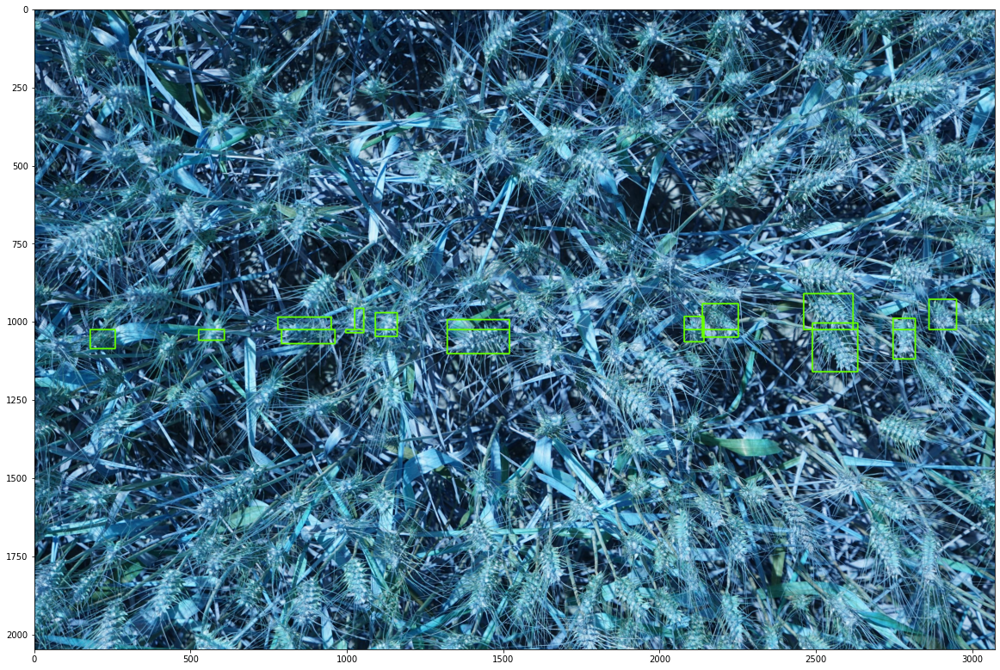

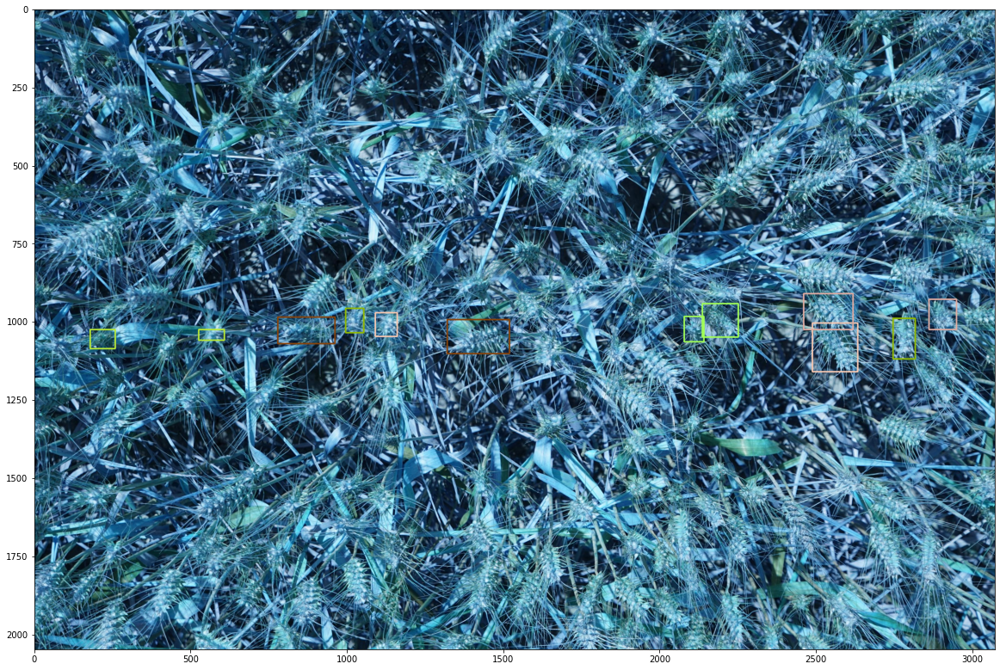

In [89]:
color = list(np.random.choice(range(256), size=100))

idx = 35

imid = csvs[idx].image_id.values[0]
size = 20
fig, ax = plt.subplots(1, 1, figsize=(size, size))
DIR_TEST = '/home/peiyuanl/kaggle/wheat_det/origin_img'
img_pth = os.path.join(DIR_TEST, imid+'.jpg')
print(img_pth)
image = cv2.imread(img_pth)

#boxes = [mat[41], mat[60]]
#boxes = mat[x1_cands]
boxes = cands.loc[cands['image_id']==imid][['x1','y1','x2','y2']].values
#boxes = [mat[0], mat[2]]
#np.random.shuffle(boxes)
#print(boxes.shape)
i = 0
for box in boxes:
    print(box)
    image = cv2.rectangle(image,(box[0], box[1]),(box[2], box[3]),(102,255,0), 3)
    i+=1

ax.imshow(image)

print('--------')

fig2, ax2 = plt.subplots(1, 1, figsize=(size, size))
image2 = cv2.imread(img_pth)

boxes = csvs[idx][['x1','y1','x2','y2']].values
#boxes = [mat[0], mat[2]]
#np.random.shuffle(boxes)
#print(boxes.shape)
i = 0
k = 0
for box in boxes:
    print(box)
    if i % 2 == 0:
        colors = (int(color[k]), int(color[k+1]), int(color[k+2]))
        k+=3
    image2 = cv2.rectangle(image2,(box[0], box[1]),(box[2], box[3]),colors, 3)
    i+=1

ax2.imshow(image2)

/home/peiyuanl/kaggle/wheat_det/origin_img/arvalis_1_0126b7d11_0923194d6_152800a47_241bbc684_fe029eca4_ddee53d7c.jpg
--------


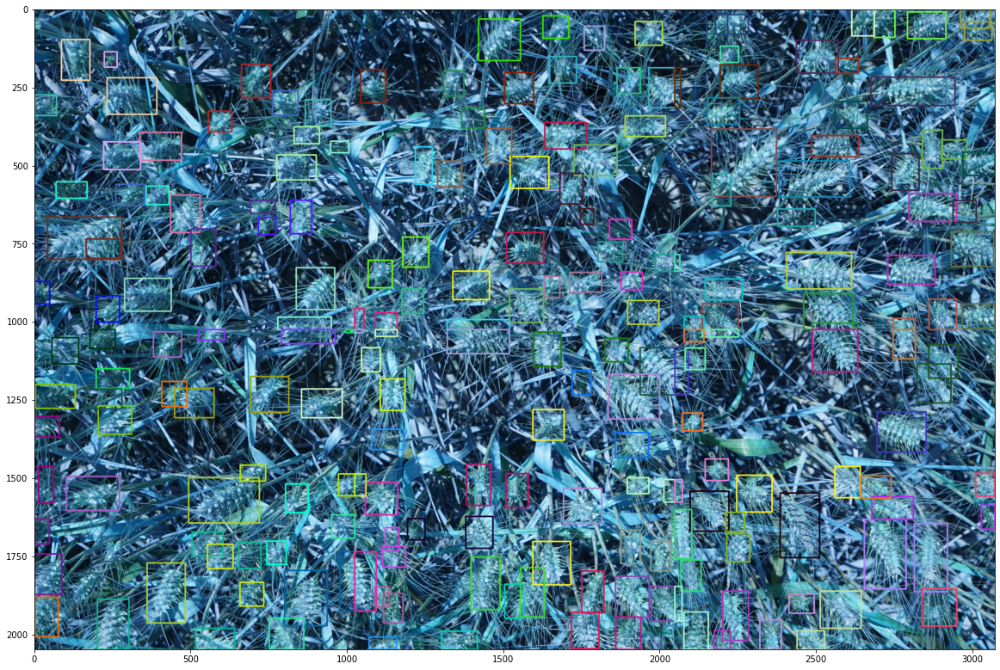

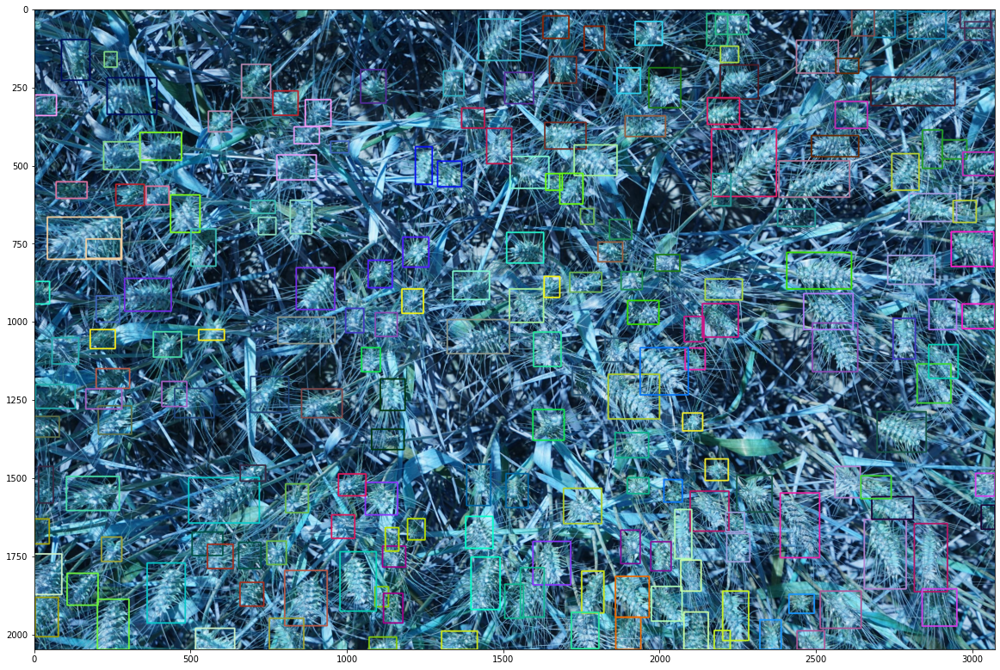

In [90]:
color = list(np.random.choice(range(256), size=300))

idx = 35

imid = csvs[idx].image_id.values[0]
size = 20
fig, ax = plt.subplots(1, 1, figsize=(size, size))
DIR_TEST = '/home/peiyuanl/kaggle/wheat_det/origin_img'
img_pth = os.path.join(DIR_TEST, imid+'.jpg')
print(img_pth)
image = cv2.imread(img_pth)

#boxes = [mat[41], mat[60]]
#boxes = mat[x1_cands]
boxes = df.loc[df['image_id']==imid][['x1','y1','x2','y2']].values
#boxes = [mat[0], mat[2]]
#np.random.shuffle(boxes)
#print(boxes.shape)
i = 0
for box in boxes:
    #print(box)
    if i % 2 == 0:
        k%=295
        colors = (int(color[k]), int(color[k+1]), int(color[k+2]))
        k+=3
    image = cv2.rectangle(image,(box[0], box[1]),(box[2], box[3]),colors, 3)
    i+=1

ax.imshow(image)

print('--------')

fig2, ax2 = plt.subplots(1, 1, figsize=(size, size))
image2 = cv2.imread(img_pth)

boxes = corrected.loc[corrected['image_id']==imid][['x1','y1','x2','y2']].values
#boxes = [mat[0], mat[2]]
#np.random.shuffle(boxes)
#print(boxes.shape)
i = 0
k = 0
for box in boxes:
    #print(box)
    if i % 2 == 0:
        k%=295
        colors = (int(color[k]), int(color[k+1]), int(color[k+2]))
        k+=3
    image2 = cv2.rectangle(image2,(box[0], box[1]),(box[2], box[3]),colors, 3)
    i+=1

ax2.imshow(image2)

In [ ]:
pd.concat([a,b,c,d]).drop_duplicates()

In [ ]:
b =pd.concat([df,df])

In [ ]:
b.drop_duplicates() == df

In [ ]:
set([1,2,3]) - set([1])

In [ ]:
import numpy as np
import os
from PIL import Image
from tqdm import tqdm
import json